In [1]:
# Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import datetime
import math
import plotly
import plotly.express as px
warnings.filterwarnings('ignore')

In [2]:
# Time Window to calculate 5 year returns
start=datetime.datetime(2015,10,1)
end=datetime.datetime(2020,9,30)

In [3]:
# Required Columns for Analysis
cols = ['Date','Close','Volume']

### Reading Aviation sector datasets

In [4]:
AAL = pd.read_csv(r'C:\Users\prabhat.sharma\Documents\NF\Dataset - I\aviation\AAL.csv',usecols=cols)
ALGT = pd.read_csv(r'C:\Users\prabhat.sharma\Documents\NF\Dataset - I\aviation\ALGT.csv', usecols=cols)
ALK = pd.read_csv(r'C:\Users\prabhat.sharma\Documents\NF\Dataset - I\aviation\ALK.csv', usecols=cols)
DAL = pd.read_csv(r'C:\Users\prabhat.sharma\Documents\NF\Dataset - I\aviation\DAL.csv', usecols=cols)
HA = pd.read_csv(r'C:\Users\prabhat.sharma\Documents\NF\Dataset - I\aviation\HA.csv', usecols=cols)
LUV = pd.read_csv(r'C:\Users\prabhat.sharma\Documents\NF\Dataset - I\aviation\LUV.csv', usecols=cols)

### Reading finance sector datasets

In [5]:
BCS = pd.read_csv(r'C:\Users\prabhat.sharma\Documents\NF\Dataset - I\finance\BCS.csv',usecols=cols)
CS = pd.read_csv(r'C:\Users\prabhat.sharma\Documents\NF\Dataset - I\finance\CS.csv',usecols=cols)
DB = pd.read_csv(r'C:\Users\prabhat.sharma\Documents\NF\Dataset - I\finance\DB.csv',usecols=cols)
GS = pd.read_csv(r'C:\Users\prabhat.sharma\Documents\NF\Dataset - I\finance\GS.csv',usecols=cols)
MS = pd.read_csv(r'C:\Users\prabhat.sharma\Documents\NF\Dataset - I\finance\MS.csv',usecols=cols)
WFC = pd.read_csv(r'C:\Users\prabhat.sharma\Documents\NF\Dataset - I\finance\WFC.csv',usecols=cols)

### Reading pharma sector datasets

In [6]:
BHC = pd.read_csv(r'C:\Users\prabhat.sharma\Documents\NF\Dataset - I\pharma_health\BHC.csv',usecols=cols)
JNJ = pd.read_csv(r'C:\Users\prabhat.sharma\Documents\NF\Dataset - I\pharma_health\JNJ.csv',usecols=cols)
MRK = pd.read_csv(r'C:\Users\prabhat.sharma\Documents\NF\Dataset - I\pharma_health\MRK.csv',usecols=cols)
PFE = pd.read_csv(r'C:\Users\prabhat.sharma\Documents\NF\Dataset - I\pharma_health\PFE.csv',usecols=cols)
RHHBY = pd.read_csv(r'C:\Users\prabhat.sharma\Documents\NF\Dataset - I\pharma_health\RHHBY.csv',usecols=cols)
UNH = pd.read_csv(r'C:\Users\prabhat.sharma\Documents\NF\Dataset - I\pharma_health\UNH.csv',usecols=cols)

### Reading techology sector datasets

In [7]:
AAPL = pd.read_csv(r'C:\Users\prabhat.sharma\Documents\NF\Dataset - I\tech\AAPL.csv',usecols=cols)
AMZN = pd.read_csv(r'C:\Users\prabhat.sharma\Documents\NF\Dataset - I\tech\AMZN.csv',usecols=cols)
FB = pd.read_csv(r'C:\Users\prabhat.sharma\Documents\NF\Dataset - I\tech\FB.csv',usecols=cols)
GOOG = pd.read_csv(r'C:\Users\prabhat.sharma\Documents\NF\Dataset - I\tech\GOOG.csv',usecols=cols)
IBM = pd.read_csv(r'C:\Users\prabhat.sharma\Documents\NF\Dataset - I\tech\IBM.csv',usecols=cols)
MFST = pd.read_csv(r'C:\Users\prabhat.sharma\Documents\NF\Dataset - I\tech\MSFT.csv',usecols=cols)

In [8]:
Aviation = ['AAL','ALGT','ALK','DAL','HA','LUV']
Pharma = ['BHC','JNJ','MRK','PFE','RHHBY','UNH']
Finance = ['BCS','CS','DB','GS','MS','WFC']
Tech = ['AAPL','AMZN','FB','GOOG','IBM','MFST']

# SECTOR-WISE DATASET

### Aviation Dataset

In [9]:
# Converting 'Date' to Date_time format
AAL['Date'] = pd.to_datetime(AAL["Date"],format='%y%m%d',infer_datetime_format=True)
ALGT['Date'] = pd.to_datetime(ALGT["Date"],format='%y%m%d',infer_datetime_format=True)
ALK['Date'] = pd.to_datetime(ALK["Date"],format='%y%m%d',infer_datetime_format=True)
DAL['Date'] = pd.to_datetime(DAL["Date"],format='%y%m%d',infer_datetime_format=True)
HA['Date'] = pd.to_datetime(HA["Date"],format='%y%m%d',infer_datetime_format=True)
LUV['Date'] = pd.to_datetime(LUV["Date"],format='%y%m%d',infer_datetime_format=True)

In [10]:
aviation_df = AAL.merge(ALGT,on='Date',how='inner').merge(ALK,on='Date',how='inner').merge(DAL,on='Date',how='inner').merge(HA,on='Date',how='inner').merge(LUV,on='Date',how='inner')
aviation_df.columns = ['Date','AAL','AAL_Vol','ALGT','ALGT_Vol','ALK','ALK_Vol','DAL','DAL_Vol','HA','HA_Vol','LUV','LUV_Vol']

In [11]:
av_mask = (aviation_df['Date'] >= start) & (aviation_df['Date'] <= end)
aviation = aviation_df.loc[av_mask]

In [12]:
# Final Dataset for Aviation
aviation = aviation.set_index('Date')
aviation.head()

,AAL,AAL_Vol,ALGT,ALGT_Vol,ALK,ALK_Vol,DAL,DAL_Vol,HA,HA_Vol,LUV,LUV_Vol
Date,,,,,,,,,,,,
2015-12-01,49.580002,18261300,154.360001,142700.0,60.610001,1100000.0,46.060001,11573400.0,24.219999,1078900.0,40.250000,7095900.0
2015-10-02,48.049999,9085300,179.050003,117500.0,65.370003,1965200.0,45.320000,11276400.0,18.340000,3710900.0,43.779999,5881500.0
2015-11-02,47.590000,10060200,181.520004,129600.0,64.510002,1560900.0,44.980000,9619100.0,18.700001,2006300.0,43.500000,5288900.0
2015-12-02,47.880001,9542800,182.490005,112200.0,62.750000,2822200.0,44.810001,15764800.0,19.040001,2306000.0,43.500000,7304400.0
2015-10-03,46.740002,9337100,191.759995,133900.0,64.169998,1226000.0,43.419998,9909400.0,18.809999,1414700.0,42.939999,5667600.0


### Finance Dataset

In [13]:
# Converting 'Date' to Date_time format
BCS['Date'] = pd.to_datetime(BCS["Date"],format='%y%m%d',infer_datetime_format=True)
CS['Date'] = pd.to_datetime(CS["Date"],format='%y%m%d',infer_datetime_format=True)
DB['Date'] = pd.to_datetime(DB["Date"],format='%y%m%d',infer_datetime_format=True)
GS['Date'] = pd.to_datetime(GS["Date"],format='%y%m%d',infer_datetime_format=True)
MS['Date'] = pd.to_datetime(MS["Date"],format='%y%m%d',infer_datetime_format=True)
WFC['Date'] = pd.to_datetime(WFC["Date"],format='%y%m%d',infer_datetime_format=True)

In [14]:
finance_df = BCS.merge(CS,on='Date',how='inner').merge(DB,on='Date',how='inner').merge(GS,on='Date',how='inner').merge(MS,on='Date',how='inner').merge(WFC,on='Date',how='inner')
finance_df.columns = ['Date','BCS','BCS_Vol','CS','CS_Vol','DB','DB_Vol','GS','GS_Vol','MS','MS_Vol','WFC','WFC_Vol']

In [15]:
fin_mask = (finance_df['Date'] >= start) & (finance_df['Date'] <= end)
finance = finance_df.loc[fin_mask]

In [16]:
# Final Dataset for Finance
finance = finance.set_index('Date')
finance.head()

,BCS,BCS_Vol,CS,CS_Vol,DB,DB_Vol,GS,GS_Vol,MS,MS_Vol,WFC,WFC_Vol
Date,,,,,,,,,,,,
2015-12-01,14.03,1730000.0,23.080000,1130600.0,28.23,1444800.0,185.070007,2084200.0,36.369999,9385900.0,52.049999,16967500.0
2015-10-02,15.48,2953500.0,21.570000,1224300.0,30.41,1679100.0,184.559998,2556300.0,36.160000,12491700.0,54.570000,12342500.0
2015-11-02,15.38,1452900.0,21.410000,1023900.0,30.17,1229100.0,187.649994,4079600.0,36.369999,7798100.0,53.900002,18296800.0
2015-12-02,15.65,4742200.0,23.420000,3060600.0,31.59,2276800.0,189.779999,3086700.0,36.900002,8167100.0,54.860001,20159500.0
2015-10-03,15.31,2644900.0,25.110001,4373700.0,31.16,1730900.0,182.710007,2768500.0,34.880001,10996700.0,53.290001,18723200.0


### Pharmacy Dataset

In [17]:
# Converting 'Date' to Date_time format
BHC['Date'] = pd.to_datetime(BHC["Date"],format='%y%m%d',infer_datetime_format=True)
JNJ['Date'] = pd.to_datetime(JNJ["Date"],format='%y%m%d',infer_datetime_format=True)
MRK['Date'] = pd.to_datetime(MRK["Date"],format='%y%m%d',infer_datetime_format=True)
PFE['Date'] = pd.to_datetime(PFE["Date"],format='%y%m%d',infer_datetime_format=True)
RHHBY['Date'] = pd.to_datetime(RHHBY["Date"],format='%y%m%d',infer_datetime_format=True)
UNH['Date'] = pd.to_datetime(UNH["Date"],format='%y%m%d',infer_datetime_format=True)

In [18]:
pharmacy_df = BHC.merge(JNJ,on='Date',how='inner').merge(MRK,on='Date',how='inner').merge(PFE,on='Date',how='inner').merge(RHHBY,on='Date',how='inner').merge(UNH,on='Date',how='inner')
pharmacy_df.columns = ['Date','BHC','BHC_Vol','JNJ','JNJ_Vol','MRK','MRK_Vol','PFE','PFE_Vol','RHHBY','RHHBY_Vol','UNH','UNH_Vol']

In [19]:
phm_mask = (pharmacy_df['Date'] >= start) & (pharmacy_df['Date'] <= end)
pharmacy = pharmacy_df.loc[phm_mask]

In [20]:
# Final Dataset for Pharmacy
pharmacy = pharmacy.set_index('Date')
pharmacy.head()

,BHC,BHC_Vol,JNJ,JNJ_Vol,MRK,MRK_Vol,PFE,PFE_Vol,RHHBY,RHHBY_Vol,UNH,UNH_Vol
Date,,,,,,,,,,,,
2015-12-01,155.500000,2530000.0,104.580002,6839000.0,62.299999,11569000.0,32.770000,23593800.0,34.660000,1070100.0,102.550003,3051500.0
2015-10-02,164.130005,1712800.0,100.349998,12275500.0,58.849998,9539400.0,34.150002,59424400.0,32.970001,5899600.0,108.970001,5437400.0
2015-11-02,164.339996,2207700.0,100.379997,8177000.0,58.740002,10483900.0,34.250000,39444600.0,32.689999,1665800.0,109.849998,3798500.0
2015-12-02,167.500000,2907300.0,98.440002,25835200.0,58.880001,7207700.0,34.869999,43656800.0,32.459999,2616200.0,109.839996,3378000.0
2015-10-03,201.479996,2664900.0,99.529999,8735700.0,56.580002,13125000.0,33.779999,38277700.0,32.490002,1449900.0,112.459999,3957900.0


### Technology Dataset

In [21]:
# Converting 'Date' to Date_time format
AAPL['Date'] = pd.to_datetime(AAPL["Date"],format='%y%m%d',infer_datetime_format=True) 
AMZN['Date'] = pd.to_datetime(AMZN["Date"],format='%y%m%d',infer_datetime_format=True)
FB['Date'] = pd.to_datetime(FB["Date"],format='%y%m%d',infer_datetime_format=True)
GOOG['Date'] = pd.to_datetime(GOOG["Date"],format='%y%m%d',infer_datetime_format=True)
IBM['Date'] = pd.to_datetime(IBM["Date"],format='%y%m%d',infer_datetime_format=True)
MFST['Date'] = pd.to_datetime(MFST["Date"],format='%y%m%d',infer_datetime_format=True)

In [22]:
tech_df = AAPL.merge(AMZN,on='Date',how='inner').merge(FB,on='Date',how='inner').merge(GOOG,on='Date',how='inner').merge(IBM,on='Date',how='inner').merge(MFST,on='Date',how='inner')
tech_df.columns = ['Date','AAPL','AAPL_Vol','AMZN','AMZN_Vol','FB','FB_Vol','GOOG','GOOG_Vol','IBM','IBM_Vol','MFST','MFST_Vol']

In [23]:
th_mask = (tech_df['Date'] >= start) & (tech_df['Date'] <= end)
tech = tech_df.loc[th_mask]

In [24]:
# Final Dataset for Technology
tech = tech.set_index('Date')
tech.head()

,AAPL,AAPL_Vol,AMZN,AMZN_Vol,FB,FB_Vol,GOOG,GOOG_Vol,IBM,IBM_Vol,MFST,MFST_Vol
Date,,,,,,,,,,,,
2015-12-01,27.312500,198603200,291.410004,3421400.0,76.720001,19190200.0,491.201416,2326700.0,156.440002,4187600.0,46.599998,23651900.0
2015-10-02,30.504999,248034000,373.000000,2287200.0,75.190002,15811300.0,535.469849,1749800.0,158.559998,4440600.0,42.599998,29670700.0
2015-11-02,31.219999,294247200,375.140015,2786500.0,76.510002,20877400.0,534.502502,1377700.0,158.199997,3626700.0,42.380001,38262500.0
2015-12-02,31.615000,297898000,377.170013,2791100.0,76.230003,17235000.0,541.443481,1620200.0,158.520004,3333100.0,43.090000,33268800.0
2015-10-03,31.127501,275426400,369.510010,3121000.0,77.550003,23067100.0,553.490417,1792300.0,157.809998,4601000.0,42.029999,39159700.0


### Reading & Processing S&P 500 Dataset

In [25]:
s_p = pd.read_csv(r'C:\Users\prabhat.sharma\Documents\NF\Dataset - I\S&P500.csv',usecols=cols)
s_p['Date'] = pd.to_datetime(s_p["Date"],format='%y%m%d',infer_datetime_format=True)

In [26]:
s_p_mask = (s_p['Date'] >= start) & (s_p['Date'] <= end)
s_p = s_p.loc[s_p_mask]

In [27]:
# Final dataset for S&P 500
s_p = s_p.set_index('Date')
s_p.head()

,Close,Volume
Date,,
2015-12-01,2028.260010,3456460000
2015-10-02,2068.590088,3669850000
2015-11-02,2068.530029,3596860000
2015-12-02,2088.479980,3788350000
2015-10-03,2044.160034,3668900000


# COMBINED DATASET

In [28]:
combined_dataset = aviation.merge(finance,on='Date',how='inner').merge(pharmacy,on='Date',how='inner').merge(tech,on='Date',how='inner').merge(s_p,how='inner',on='Date')
combined_dataset = combined_dataset.sort_values('Date')
combined_dataset

,AAL,AAL_Vol,ALGT,ALGT_Vol,ALK,ALK_Vol,DAL,DAL_Vol,HA,HA_Vol,...,FB,FB_Vol,GOOG,GOOG_Vol,IBM,IBM_Vol,MFST,MFST_Vol,Close,Volume
Date,,,,,,,,,,,,,,,,,,,,,
2015-10-02,48.049999,9085300,179.050003,117500.0,65.370003,1965200.0,45.320000,11276400.0,18.340000,3710900.0,...,75.190002,15811300.0,535.469849,1749800.0,158.559998,4440600.0,42.599998,29670700.0,2068.590088,3669850000
2015-10-03,46.740002,9337100,191.759995,133900.0,64.169998,1226000.0,43.419998,9909400.0,18.809999,1414700.0,...,77.550003,23067100.0,553.490417,1792300.0,157.809998,4601000.0,42.029999,39159700.0,2044.160034,3668900000
2015-10-04,47.730000,11713400,168.220001,144100.0,63.939999,804400.0,43.230000,8160300.0,21.360001,659400.0,...,82.040001,12529700.0,538.531433,1409400.0,162.860001,2515700.0,41.720001,28022000.0,2102.060059,3156200000
2015-10-06,40.430000,15731900,162.839996,159100.0,60.759998,1568900.0,41.060001,11590200.0,22.400000,1599300.0,...,82.160004,21531200.0,536.690002,1815000.0,168.919998,4680500.0,46.610001,28417400.0,2105.199951,3414320000
2015-10-07,41.209999,16451700,194.350006,274100.0,70.550003,2292100.0,42.459999,13746100.0,24.010000,910500.0,...,87.949997,23245900.0,530.130005,1956700.0,166.949997,4538300.0,44.610001,25465800.0,2076.620117,3065070000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-09-24,11.770000,49163200,121.500000,172300.0,35.700001,3326000.0,29.010000,22257800.0,12.400000,879700.0,...,249.529999,20006800.0,1428.290039,1450200.0,118.089996,3546200.0,203.190002,31202500.0,3246.590088,4599470000
2020-09-25,12.290000,43764000,123.760002,115100.0,36.700001,1767600.0,29.780001,21831500.0,12.800000,923400.0,...,254.820007,18351300.0,1444.959961,1323000.0,118.949997,2953700.0,207.820007,29437300.0,3298.459961,3792220000
2020-09-28,12.760000,63558200,127.110001,188400.0,37.540001,2922800.0,31.340000,22098400.0,13.380000,1076800.0,...,256.820007,18826300.0,1464.520020,2007900.0,121.730003,3509200.0,209.440002,32004900.0,3351.600098,3946060000


In [29]:
combined_dataset.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1240 entries, 2015-10-02 to 2020-09-30
Data columns (total 50 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   AAL        1240 non-null   float64
 1   AAL_Vol    1240 non-null   int64  
 2   ALGT       1240 non-null   float64
 3   ALGT_Vol   1240 non-null   float64
 4   ALK        1240 non-null   float64
 5   ALK_Vol    1240 non-null   float64
 6   DAL        1240 non-null   float64
 7   DAL_Vol    1240 non-null   float64
 8   HA         1240 non-null   float64
 9   HA_Vol     1240 non-null   float64
 10  LUV        1240 non-null   float64
 11  LUV_Vol    1240 non-null   float64
 12  BCS        1240 non-null   float64
 13  BCS_Vol    1240 non-null   float64
 14  CS         1240 non-null   float64
 15  CS_Vol     1240 non-null   float64
 16  DB         1240 non-null   float64
 17  DB_Vol     1240 non-null   float64
 18  GS         1240 non-null   float64
 19  GS_Vol     1240 non-null   flo

In [30]:
# Converting int64 datatypes columns to float64 datatypes columns
combined_dataset['AAL_Vol'] = combined_dataset['AAL_Vol'].astype(float) 
combined_dataset['AAPL_Vol'] = combined_dataset['AAPL_Vol'].astype(float)

In [31]:
combined_dataset.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1240 entries, 2015-10-02 to 2020-09-30
Data columns (total 50 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   AAL        1240 non-null   float64
 1   AAL_Vol    1240 non-null   float64
 2   ALGT       1240 non-null   float64
 3   ALGT_Vol   1240 non-null   float64
 4   ALK        1240 non-null   float64
 5   ALK_Vol    1240 non-null   float64
 6   DAL        1240 non-null   float64
 7   DAL_Vol    1240 non-null   float64
 8   HA         1240 non-null   float64
 9   HA_Vol     1240 non-null   float64
 10  LUV        1240 non-null   float64
 11  LUV_Vol    1240 non-null   float64
 12  BCS        1240 non-null   float64
 13  BCS_Vol    1240 non-null   float64
 14  CS         1240 non-null   float64
 15  CS_Vol     1240 non-null   float64
 16  DB         1240 non-null   float64
 17  DB_Vol     1240 non-null   float64
 18  GS         1240 non-null   float64
 19  GS_Vol     1240 non-null   flo

### VOLUME FINAL DATASET

In [32]:
Vol_df = combined_dataset.columns[1:len(combined_dataset.columns):2]
combined_Vol = combined_dataset[Vol_df]

In [33]:
combined_Vol.head()

,AAL_Vol,ALGT_Vol,ALK_Vol,DAL_Vol,HA_Vol,LUV_Vol,BCS_Vol,CS_Vol,DB_Vol,GS_Vol,...,PFE_Vol,RHHBY_Vol,UNH_Vol,AAPL_Vol,AMZN_Vol,FB_Vol,GOOG_Vol,IBM_Vol,MFST_Vol,Volume
Date,,,,,,,,,,,,,,,,,,,,,
2015-10-02,9085300.0,117500.0,1965200.0,11276400.0,3710900.0,5881500.0,2953500.0,1224300.0,1679100.0,2556300.0,...,59424400.0,5899600.0,5437400.0,248034000.0,2287200.0,15811300.0,1749800.0,4440600.0,29670700.0,3669850000
2015-10-03,9337100.0,133900.0,1226000.0,9909400.0,1414700.0,5667600.0,2644900.0,4373700.0,1730900.0,2768500.0,...,38277700.0,1449900.0,3957900.0,275426400.0,3121000.0,23067100.0,1792300.0,4601000.0,39159700.0,3668900000
2015-10-04,11713400.0,144100.0,804400.0,8160300.0,659400.0,4541300.0,2075100.0,710200.0,1318500.0,1764800.0,...,24353700.0,351800.0,2232600.0,160752000.0,2573500.0,12529700.0,1409400.0,2515700.0,28022000.0,3156200000
2015-10-06,15731900.0,159100.0,1568900.0,11590200.0,1599300.0,17768400.0,3996200.0,1219000.0,1838900.0,2677300.0,...,23674000.0,5916500.0,4006400.0,156349200.0,2172300.0,21531200.0,1815000.0,4680500.0,28417400.0,3414320000
2015-10-07,16451700.0,274100.0,2292100.0,13746100.0,910500.0,9102800.0,2705900.0,1365000.0,3117500.0,1840600.0,...,21146400.0,1109200.0,4033500.0,245418000.0,2401000.0,23245900.0,1956700.0,4538300.0,25465800.0,3065070000


### CLOSE PRICE FINAL DATASET

In [34]:
Close_df = combined_dataset.columns[0:len(combined_dataset.columns):2]
combined_close = combined_dataset[Close_df]

In [35]:
combined_close.head()

,AAL,ALGT,ALK,DAL,HA,LUV,BCS,CS,DB,GS,...,PFE,RHHBY,UNH,AAPL,AMZN,FB,GOOG,IBM,MFST,Close
Date,,,,,,,,,,,,,,,,,,,,,
2015-10-02,48.049999,179.050003,65.370003,45.320000,18.340000,43.779999,15.48,21.570000,30.410000,184.559998,...,34.150002,32.970001,108.970001,30.504999,373.000000,75.190002,535.469849,158.559998,42.599998,2068.590088
2015-10-03,46.740002,191.759995,64.169998,43.419998,18.809999,42.939999,15.31,25.110001,31.160000,182.710007,...,33.779999,32.490002,112.459999,31.127501,369.510010,77.550003,553.490417,157.809998,42.029999,2044.160034
2015-10-04,47.730000,168.220001,63.939999,43.230000,21.360001,42.820000,15.14,27.700001,35.160000,195.639999,...,35.439999,35.520000,119.000000,31.775000,382.649994,82.040001,538.531433,162.860001,41.720001,2102.060059
2015-10-06,40.430000,162.839996,60.759998,41.060001,22.400000,34.450001,16.68,27.670000,32.169998,213.130005,...,34.310001,36.790001,118.550003,32.220001,430.769989,82.160004,536.690002,168.919998,46.610001,2105.199951
2015-10-07,41.209999,194.350006,70.550003,42.459999,24.010000,33.830002,16.65,28.750000,31.910000,207.190002,...,34.360001,36.540001,122.150002,30.820000,443.510010,87.949997,530.130005,166.949997,44.610001,2076.620117


In [73]:
combined_close.isnull().sum()

AAL      0
ALGT     0
ALK      0
DAL      0
HA       0
LUV      0
BCS      0
CS       0
DB       0
GS       0
MS       0
WFC      0
BHC      0
JNJ      0
MRK      0
PFE      0
RHHBY    0
UNH      0
AAPL     0
AMZN     0
FB       0
GOOG     0
IBM      0
MFST     0
Close    0
dtype: int64

No Missing Values

In [74]:
combined_Vol.isnull().sum()

AAL_Vol      0
ALGT_Vol     0
ALK_Vol      0
DAL_Vol      0
HA_Vol       0
LUV_Vol      0
BCS_Vol      0
CS_Vol       0
DB_Vol       0
GS_Vol       0
MS_Vol       0
WFC_Vol      0
BHC_Vol      0
JNJ_Vol      0
MRK_Vol      0
PFE_Vol      0
RHHBY_Vol    0
UNH_Vol      0
AAPL_Vol     0
AMZN_Vol     0
FB_Vol       0
GOOG_Vol     0
IBM_Vol      0
MFST_Vol     0
Volume       0
dtype: int64

No Missing Values

# EDA (VISUALIZATION)

### Without normalization

In [36]:
fig = px.line(combined_close, title="Close price") 
fig.update_layout(
    margin=dict(l=20, r=20, t=20, b=20),
    paper_bgcolor="LightSteelBlue",
)
fig.show()

### Normalized close prices

In [37]:
combined_close_norm = combined_close/combined_close.iloc[0]
fig = px.line(combined_close_norm, title="Normalized Close price") 
fig.update_layout(
    margin=dict(l=20, r=20, t=20, b=20),
    paper_bgcolor="LightSteelBlue",
)
fig.show()

### Relative strength (wrt S&P 500)

In [38]:
relative_strength = combined_close.div(combined_close['Close'],axis=0)
fig = px.line(relative_strength, title="Relative Strength") 
fig.update_layout(
    margin=dict(l=20, r=20, t=20, b=20),
    paper_bgcolor="LightSteelBlue",
)
fig.show()

### S&P500

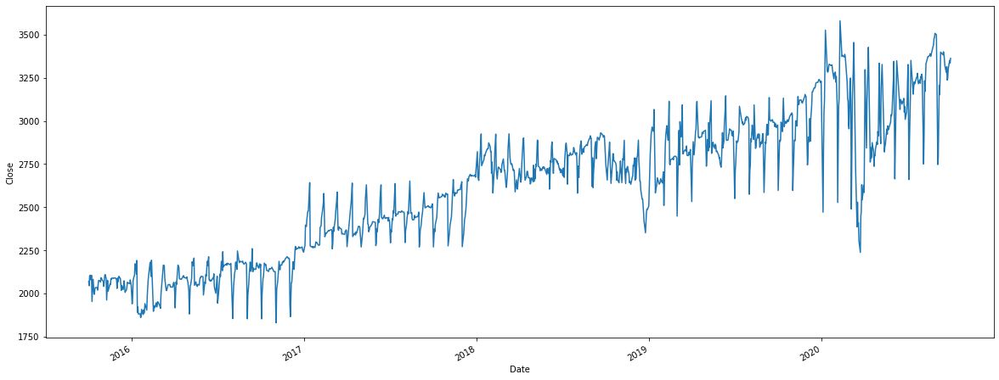

In [39]:
plt.figure(figsize=(20,8))
s_p['Close'].plot(kind='line')
plt.xlabel('Date')
plt.ylabel('Close')
plt.show()

### sectorwise box plot

In [40]:
fig = px.histogram(aviation.iloc[ : , 0::2],title="Aviation Close price") 
fig.update_layout(
    margin=dict(l=20, r=20, t=20, b=20),
    paper_bgcolor="LightSteelBlue",
)
fig.show()

In [41]:
fig = px.histogram(finance.iloc[ : , 0::2],title="Finance Close price") 
fig.update_layout(
    margin=dict(l=20, r=20, t=20, b=20),
    paper_bgcolor="LightSteelBlue",
)
fig.show()

In [42]:
fig = px.histogram(pharmacy.iloc[ : , 0::2],title="Pharmacy Close price") 
fig.update_layout(
    margin=dict(l=20, r=20, t=20, b=20),
    paper_bgcolor="LightSteelBlue",
)
fig.show()

In [43]:
fig = px.histogram(tech.iloc[ : , 0::2],title="Technology Close price") 
fig.update_layout(
    margin=dict(l=20, r=20, t=20, b=20),
    paper_bgcolor="LightSteelBlue",
)
fig.show()

### Volume Traded

In [44]:
fig = px.box(combined_Vol.loc[ : , combined_Vol.columns != 'Volume'], title="Volume Traded") 
fig.update_layout(
    margin=dict(l=20, r=20, t=20, b=20),
    paper_bgcolor="LightSteelBlue",
)
fig.show()

In [45]:
fig = px.scatter(combined_Vol.loc[ : , combined_Vol.columns != 'Volume'], title="Volume Traded") 
fig.update_layout(
    margin=dict(l=20, r=20, t=20, b=20),
    paper_bgcolor="LightSteelBlue",
)

fig.show()

### STOCK RETURNS

In [46]:
daily_stock_returns = combined_close.pct_change()
daily_stock_returns.head()

,AAL,ALGT,ALK,DAL,HA,LUV,BCS,CS,DB,GS,...,PFE,RHHBY,UNH,AAPL,AMZN,FB,GOOG,IBM,MFST,Close
Date,,,,,,,,,,,,,,,,,,,,,
2015-10-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-10-03,-0.027263,0.070986,-0.018357,-0.041924,0.025627,-0.019187,-0.010982,0.164117,0.024663,-0.010024,...,-0.010835,-0.014559,0.032027,0.020407,-0.009357,0.031387,0.033654,-0.004730,-0.013380,-0.011810
2015-10-04,0.021181,-0.122758,-0.003584,-0.004376,0.135566,-0.002795,-0.011104,0.103146,0.128370,0.070768,...,0.049142,0.093259,0.058154,0.020802,0.035561,0.057898,-0.027027,0.032001,-0.007376,0.028325
2015-10-06,-0.152944,-0.031982,-0.049734,-0.050197,0.048689,-0.195469,0.101717,-0.001083,-0.085040,0.089399,...,-0.031885,0.035755,-0.003781,0.014005,0.125755,0.001463,-0.003419,0.037210,0.117210,0.001494
2015-10-07,0.019293,0.193503,0.161126,0.034096,0.071875,-0.017997,-0.001799,0.039031,-0.008082,-0.027870,...,0.001457,-0.006795,0.030367,-0.043451,0.029575,0.070472,-0.012223,-0.011662,-0.042909,-0.013576


### METRIC CALCULATION

In [47]:
#portfolio = pd.DataFrame(data=Avg_daily_returns,columns=['Average Daily Returns'])
#portfolio

In [48]:
Avg_daily_returns = daily_stock_returns.mean()
Avg_daily_returns

AAL      0.008492
ALGT     0.006653
ALK      0.006110
DAL      0.006250
HA       0.009914
LUV      0.004039
BCS      0.004903
CS       0.004059
DB       0.005481
GS       0.002868
MS       0.003600
WFC      0.003438
BHC      0.031329
JNJ      0.001095
MRK      0.001521
PFE      0.001139
RHHBY    0.001007
UNH      0.002681
AAPL     0.005130
AMZN     0.005859
FB       0.004356
GOOG     0.002401
IBM      0.001632
MFST     0.003334
Close    0.001192
dtype: float64

In [49]:
Risk = daily_stock_returns.std()
Risk

AAL      0.154292
ALGT     0.123749
ALK      0.121014
DAL      0.123339
HA       0.155907
LUV      0.093959
BCS      0.111444
CS       0.100321
DB       0.121586
GS       0.075158
MS       0.080937
WFC      0.102076
BHC      0.375916
JNJ      0.038996
MRK      0.048940
PFE      0.046139
RHHBY    0.040064
UNH      0.059443
AAPL     0.087387
AMZN     0.086569
FB       0.081424
GOOG     0.055898
IBM      0.061375
MFST     0.062025
Close    0.039606
dtype: float64

### ANNUALIZED RETURNS, ANNUALIZED RISKS, CUMULATIVE RETURNS

In [50]:
Annualized_returns = (pow(combined_close.iloc[-1]/combined_close.iloc[0],1/5)-1)*100
Annualized_returns

AAL     -23.867218
ALGT     -7.722356
ALK     -10.938156
DAL      -7.566475
HA       -6.809698
LUV      -3.049265
BCS     -20.198078
CS      -14.302332
DB      -22.686992
GS        1.718215
MS        5.982365
WFC     -15.499411
BHC     -37.590227
JNJ       8.209104
MRK       7.106045
PFE       1.450705
RHHBY     5.362303
UNH      23.397247
AAPL     30.579502
AMZN     53.209367
FB       28.349765
GOOG     22.375033
IBM      -5.158596
MFST     37.625316
Close    10.207331
dtype: float64

In [51]:
Annualized_Risk = Risk*np.sqrt(252)
Annualized_Risk

AAL      2.449317
ALGT     1.964453
ALK      1.921035
DAL      1.957946
HA       2.474942
LUV      1.491554
BCS      1.769126
CS       1.592549
DB       1.930123
GS       1.193091
MS       1.284839
WFC      1.620412
BHC      5.967480
JNJ      0.619043
MRK      0.776898
PFE      0.732435
RHHBY    0.635990
UNH      0.943634
AAPL     1.387225
AMZN     1.374236
FB       1.292564
GOOG     0.887351
IBM      0.974304
MFST     0.984624
Close    0.628726
dtype: float64

In [52]:
Cumulative_return = (combined_close.iloc[-1]/combined_close.iloc[0])*100
Cumulative_return

AAL       25.577524
ALGT      66.908685
ALK       56.034877
DAL       67.475728
HA        70.283533
LUV       85.655552
BCS       32.364341
CS        46.221604
DB        27.622493
GS       108.891419
MS       133.711278
WFC       43.082280
BHC        9.468104
JNJ      148.360745
MRK      140.951571
PFE      107.467054
RHHBY    129.845313
UNH      286.106255
AAPL     379.642687
AMZN     844.163534
FB       348.317578
GOOG     274.450556
IBM       76.734359
MFST     493.732422
Close    162.574500
dtype: float64

### Sharpe Ratio

In [53]:
Sharpe_Ratio = ((Annualized_returns-0.75)/Annualized_Risk)/100
Sharpe_Ratio

AAL     -0.100506
ALGT    -0.043128
ALK     -0.060843
DAL     -0.042476
HA      -0.030545
LUV     -0.025472
BCS     -0.118409
CS      -0.094517
DB      -0.121427
GS       0.008115
MS       0.040724
WFC     -0.100280
BHC     -0.064249
JNJ      0.120494
MRK      0.081813
PFE      0.009567
RHHBY    0.072522
UNH      0.240000
AAPL     0.215030
AMZN     0.381735
FB       0.213527
GOOG     0.243703
IBM     -0.060644
MFST     0.374512
Close    0.150421
dtype: float64

In [54]:
metrics = {'Annualized Returns' : Annualized_returns, 
           'Annualized Risk' : Annualized_Risk, 
           'Cumulative Returns' : Cumulative_return,
           'Sharpe Ratio' : Sharpe_Ratio}

In [55]:
portfolio = pd.DataFrame(metrics)
portfolio

,Annualized Returns,Annualized Risk,Cumulative Returns,Sharpe Ratio
AAL,-23.867218,2.449317,25.577524,-0.100506
ALGT,-7.722356,1.964453,66.908685,-0.043128
ALK,-10.938156,1.921035,56.034877,-0.060843
DAL,-7.566475,1.957946,67.475728,-0.042476
HA,-6.809698,2.474942,70.283533,-0.030545
LUV,-3.049265,1.491554,85.655552,-0.025472
BCS,-20.198078,1.769126,32.364341,-0.118409
CS,-14.302332,1.592549,46.221604,-0.094517
DB,-22.686992,1.930123,27.622493,-0.121427
GS,1.718215,1.193091,108.891419,0.008115


In [56]:
investor_params = ['Risk','$Value','Goals']
investor_names = ['Mr Patrick','Mr Peter']
investor_portfolio = pd.DataFrame(columns=investor_params,index=investor_names)

In [57]:
investor_portfolio.loc['Mr Patrick','Risk'] = 'Low'
investor_portfolio.loc['Mr Peter','Risk'] = 'Ready to take more risk'
investor_portfolio.loc['Mr Patrick','$Value'] = 500000
investor_portfolio.loc['Mr Peter','$Value'] = 1000000
investor_portfolio.loc['Mr Patrick','Goals'] = 1000000

In [58]:
investor_portfolio

,Risk,$Value,Goals
Mr Patrick,Low,500000,1000000
Mr Peter,Ready to take more risk,1000000,NaN


In [59]:
portfolio['Returns'] = portfolio['Cumulative Returns']*0.5

In [60]:
portfolio

,Annualized Returns,Annualized Risk,Cumulative Returns,Sharpe Ratio,Returns
AAL,-23.867218,2.449317,25.577524,-0.100506,12.788762
ALGT,-7.722356,1.964453,66.908685,-0.043128,33.454343
ALK,-10.938156,1.921035,56.034877,-0.060843,28.017439
DAL,-7.566475,1.957946,67.475728,-0.042476,33.737864
HA,-6.809698,2.474942,70.283533,-0.030545,35.141767
LUV,-3.049265,1.491554,85.655552,-0.025472,42.827776
BCS,-20.198078,1.769126,32.364341,-0.118409,16.182171
CS,-14.302332,1.592549,46.221604,-0.094517,23.110802
DB,-22.686992,1.930123,27.622493,-0.121427,13.811246
GS,1.718215,1.193091,108.891419,0.008115,54.445710


### Expected Returns for Mr Patrick

In [61]:
portfolio['Expected Returns Patrick'] = (500000*(portfolio['Returns'])/100)

In [62]:
pd.set_option('display.float_format', '{:.2f}'.format)

In [63]:
portfolio

,Annualized Returns,Annualized Risk,Cumulative Returns,Sharpe Ratio,Returns,Expected Returns Patrick
AAL,-23.87,2.45,25.58,-0.10,12.79,63943.81
ALGT,-7.72,1.96,66.91,-0.04,33.45,167271.71
ALK,-10.94,1.92,56.03,-0.06,28.02,140087.19
DAL,-7.57,1.96,67.48,-0.04,33.74,168689.32
HA,-6.81,2.47,70.28,-0.03,35.14,175708.83
LUV,-3.05,1.49,85.66,-0.03,42.83,214138.88
BCS,-20.20,1.77,32.36,-0.12,16.18,80910.85
CS,-14.30,1.59,46.22,-0.09,23.11,115554.01
DB,-22.69,1.93,27.62,-0.12,13.81,69056.23
GS,1.72,1.19,108.89,0.01,54.45,272228.55


##### As Mr Patricks' goal was to double his money, thus ideally, stocks which gives him 1000000 or more is to be selected. It could be on of these stocks:

In [64]:
portfolio[portfolio['Expected Returns Patrick']>1000000]

,Annualized Returns,Annualized Risk,Cumulative Returns,Sharpe Ratio,Returns,Expected Returns Patrick
AMZN,53.21,1.37,844.16,0.38,422.08,2110408.83
MFST,37.63,0.98,493.73,0.37,246.87,1234331.06


### Expected Returns for Mr Peter

In [65]:
portfolio['Expected Returns Peter'] = (1000000*(portfolio['Returns'])/100)

In [66]:
portfolio

,Annualized Returns,Annualized Risk,Cumulative Returns,Sharpe Ratio,Returns,Expected Returns Patrick,Expected Returns Peter
AAL,-23.87,2.45,25.58,-0.10,12.79,63943.81,127887.62
ALGT,-7.72,1.96,66.91,-0.04,33.45,167271.71,334543.43
ALK,-10.94,1.92,56.03,-0.06,28.02,140087.19,280174.39
DAL,-7.57,1.96,67.48,-0.04,33.74,168689.32,337378.64
HA,-6.81,2.47,70.28,-0.03,35.14,175708.83,351417.67
LUV,-3.05,1.49,85.66,-0.03,42.83,214138.88,428277.76
BCS,-20.20,1.77,32.36,-0.12,16.18,80910.85,161821.71
CS,-14.30,1.59,46.22,-0.09,23.11,115554.01,231108.02
DB,-22.69,1.93,27.62,-0.12,13.81,69056.23,138112.46
GS,1.72,1.19,108.89,0.01,54.45,272228.55,544457.10


##### As Mr Peter wants highest returns (and he can also ready to bear some risk), thus the top three stocks giving maximum returns are:

In [67]:
portfolio.nlargest(3, ['Expected Returns Peter'])

,Annualized Returns,Annualized Risk,Cumulative Returns,Sharpe Ratio,Returns,Expected Returns Patrick,Expected Returns Peter
AMZN,53.21,1.37,844.16,0.38,422.08,2110408.83,4220817.67
MFST,37.63,0.98,493.73,0.37,246.87,1234331.06,2468662.11
AAPL,30.58,1.39,379.64,0.22,189.82,949106.72,1898213.44


In [71]:
portfolio.iloc[:,5:7:1]

,Expected Returns Patrick,Expected Returns Peter
AAL,63943.81,127887.62
ALGT,167271.71,334543.43
ALK,140087.19,280174.39
DAL,168689.32,337378.64
HA,175708.83,351417.67
LUV,214138.88,428277.76
BCS,80910.85,161821.71
CS,115554.01,231108.02
DB,69056.23,138112.46
GS,272228.55,544457.10


# FINAL RECOMMENDATIONS

Based on the risk an investor is willing to take, following things can be recommended:

    1. For Mr Patrick : Either of AMZN or MFST
    
    2. For Mr Peter : Any of these 3 stocks gives him highest returns - AMZN, MFST or AAPL